In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [29]:
df=pd.read_csv('mnist_train.csv')

In [30]:
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [31]:
df.shape

(42000, 785)

In [32]:
df.isnull().sum()

label       0
pixel0      0
pixel1      0
pixel2      0
pixel3      0
           ..
pixel779    0
pixel780    0
pixel781    0
pixel782    0
pixel783    0
Length: 785, dtype: int64

In [72]:
df.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
17126,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


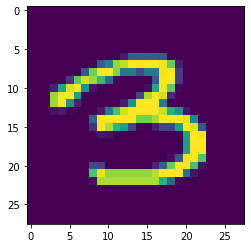

In [73]:
plt.imshow(df.iloc[17126,1:].values.reshape(28,28))

In [36]:
X=df.iloc[:,1:]
y=df['label']

In [37]:
y.head()

0    1
1    0
2    1
3    4
4    0
Name: label, dtype: int64

In [38]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=42,test_size=0.2)

X_train.shape

(33600, 784)

In [39]:
from sklearn.neighbors import KNeighborsClassifier

KNN=KNeighborsClassifier()

In [40]:
KNN.fit(X_train,y_train)

KNeighborsClassifier()

In [41]:
import time 
start=time.time()
y_pred=KNN.predict(X_test)
print(time.time()-start)

21.31290078163147


In [42]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9648809523809524

#### Now we will apply PCA and will try to achieve approx this accuracy

In [43]:
#1 Standardised our columns or we can say mean center our data
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
X_train=sc.fit_transform(X_train)
X_test=sc.transform(X_test)

In [49]:
#2 using PCA
from sklearn.decomposition import PCA
pca=PCA(n_components=100)


In [50]:
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [51]:
from sklearn.neighbors import KNeighborsClassifier

KNN=KNeighborsClassifier()

KNN.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [52]:
import time 
start=time.time()
y_pred=KNN.predict(X_test_trf)
print(time.time()-start)

2.3451650142669678


In [53]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9536904761904762

In [57]:
accuracy_score_list=[]
for i in range(1,785):
    pca=PCA(n_components=i)
    X_train_trf=pca.fit_transform(X_train)
    X_test_trf=pca.transform(X_test)
    
    KNN=KNeighborsClassifier()
    KNN.fit(X_train_trf,y_train)
    y_pred=KNN.predict(X_test_trf)
    accuracy_score_list.append(accuracy_score(y_test,y_pred))
    accuracy_score_list.sort(reverse=True)
    #print(accuracy_score(y_test,y_pred))

KeyboardInterrupt: 

In [58]:
# transforming to a 2D coordinate system
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [59]:
X_train_trf

array([[-2.71862442, -0.48980385],
       [-0.67694071, -6.75354738],
       [-3.03326501,  6.50982217],
       ...,
       [ 2.14885211,  0.78083602],
       [ 1.05955793,  0.94763059],
       [17.70262081,  1.96220912]])

In [60]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [61]:
# transforming in 3D
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [62]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:,0], y=X_train_trf[:,1], z=X_train_trf[:,2],
              color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [63]:
#eigen values
pca.explained_variance_


array([40.67111198, 29.17023398, 26.74459616])

In [65]:
#eigen vectors
pca.components_

array([[ 2.29535303e-17,  2.73319470e-19,  5.57577847e-20, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 1.96157292e-17,  1.90299879e-19, -2.92888389e-19, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-9.52966842e-17, -7.56505859e-18, -2.55912655e-19, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [66]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [67]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [68]:
pca.explained_variance_.shape

(784,)

In [69]:
pca.components_.shape

(784, 784)

In [70]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

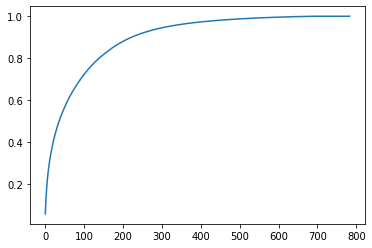

In [71]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))